# 1] Import Dependencies

In [1]:
import pandas as pd
import numpy as np

pd.set_option('display.max_rows', None)

#for text pre-processing
import re, os
import io
import string 
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize, RegexpTokenizer
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
from collections import Counter

stop = stopwords.words('english')
lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer() 
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')


# for visulization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as stats

##Part Of Speech Tagging
import spacy
from spacy.matcher import Matcher
nlp = spacy.load('en_core_web_sm')

# bag of words
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from tqdm.notebook import tqdm_notebook
from textblob import TextBlob

import pickle

# ignoring all the warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=DeprecationWarning)

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# 2] Load Dataset

In [2]:
df= pd.read_csv('C:\\Users\\HP\\Desktop\\anmol python practice\\NLP\\dataset\\Resume raw_dataset.csv').drop('Unnamed: 0',axis= 1)
df.head()

,Category,Resume,Name,Skills,Education,DOB,Experience_Years,Work_Experience,Phone,Email_ID,Links
0,SQL Developer,ANIL KUMAR MADDUKURI SQL MSBI Developer Summar...,ANIL,"SQL, ETL, Stored Procedures",[],NaN,2.40,in MS SQL Server (SSMS) and creating SSIS pack...,-,-,-
1,SQL Developer,Aradhana Tripathi Current Location Gachibowli...,Aradhana,"SQL, Stored Procedures, Database Management, D...",[],NaN,4.00,of working experience in information technolog...,-,-,-
2,SQL Developer,BUDDHA VAMSI CAREER OBJECTIVE Have 2 11 years ...,IT,"SQL, ETL, Stored Procedures",[],22-08-1994,2.11,of IT experience as Database Engineer and curr...,-,-,-
3,SQL Developer,KAMBALLA PRADEEP SYNOPSIS Looking forward to a...,KAMBALLA,"SQL, Stored Procedures, Database Management",[],NaN,2.80,of Professional Software development experienc...,-,-,-
4,SQL Developer,Hyderabad Nazeer Basha SQL and Power BI Devel...,Hyderabad,"SQL, ETL, Stored Procedures",['10'],NaN,2.60,Not Found,-,-,-


# 3] Exploratory Data Analysis 

In [3]:
print('We have {} rows and {} columns in the dataset'.format(df.shape[0],df.shape[1]))

We have 76 rows and 11 columns in the dataset


In [4]:
df.isnull().sum()

Category             0
Resume               0
Name                 0
Skills               2
Education            0
DOB                 70
Experience_Years     5
Work_Experience      0
Phone                0
Email_ID             0
Links                0
dtype: int64

In [5]:
df.duplicated().sum()

0

In [6]:
df.columns

Index(['Category', 'Resume', 'Name', 'Skills', 'Education', 'DOB',
       'Experience_Years', 'Work_Experience', 'Phone', 'Email_ID', 'Links'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76 entries, 0 to 75
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Category          76 non-null     object 
 1   Resume            76 non-null     object 
 2   Name              76 non-null     object 
 3   Skills            74 non-null     object 
 4   Education         76 non-null     object 
 5   DOB               6 non-null      object 
 6   Experience_Years  71 non-null     float64
 7   Work_Experience   76 non-null     object 
 8   Phone             76 non-null     object 
 9   Email_ID          76 non-null     object 
 10  Links             76 non-null     object 
dtypes: float64(1), object(10)
memory usage: 6.7+ KB


# 4] Text Pre-processing

## 4.1] Analyse Category column

In [8]:
fig = go.Figure(go.Pie(labels = df['Category'].value_counts().index, 
                       values = df['Category'].value_counts(),
                       hole = 0.5))
fig.show()

In [9]:
file_path = r'C:\\Users\\HP\\Desktop\\anmol python practice\\NLP\\Resumes\\'

file_name = []
profile = []
for folder in os.listdir(file_path):
    folder_path = file_path+folder
    for file in os.listdir(folder_path):
        if file.endswith('.docx'):
            profile.append(folder)
            file_name.append(file)

In [10]:
data = pd.DataFrame()
data['Resumes'] = file_name
data['Sub-Category'] = profile
fig = go.Figure(go.Pie(labels = data['Sub-Category'].value_counts().index, 
                       values = data['Sub-Category'].value_counts(),
                       hole = 0.5))
fig.show()

## 4.2] Analysing Resume column

### 4.2.1] Number of Words in Resume Column

In [11]:
df1 = pd.DataFrame(df['Resume'])

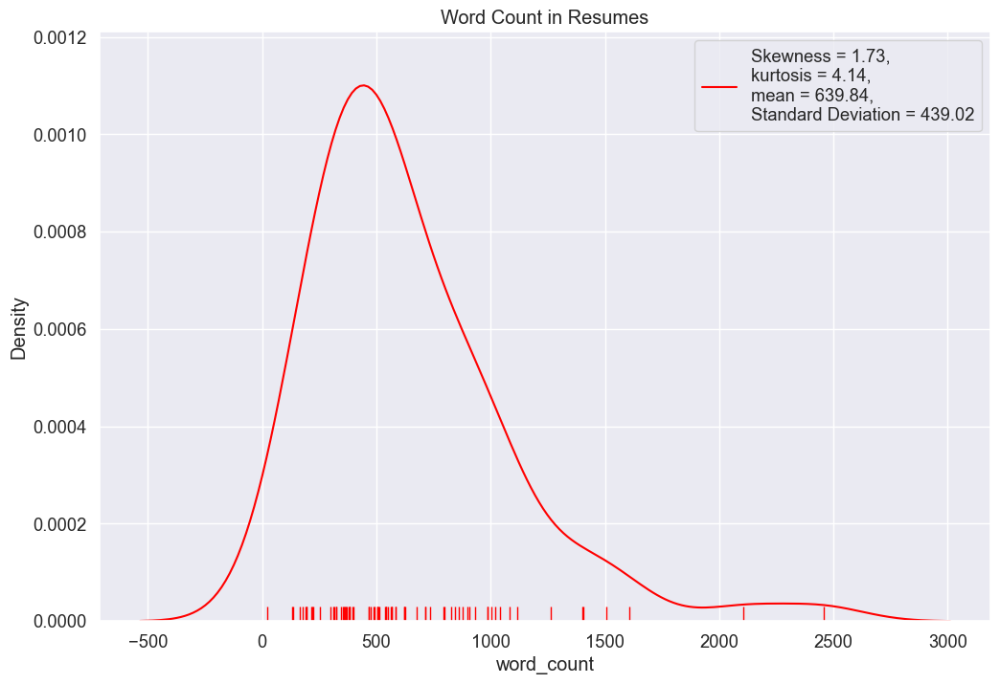

In [12]:
df1['word_count'] = df1['Resume'].apply(lambda x: len(str(x).split(" ")))

skew = df1['word_count'].skew()
kurt = df1['word_count'].kurt()
mean = df1['word_count'].mean()
std = df1['word_count'].std()

plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["word_count"], color = "red", hist=None, rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Word Count in Resumes')
plt.legend(loc='best')
plt.show()

### 4.2.2] Number of characters in Resume Column

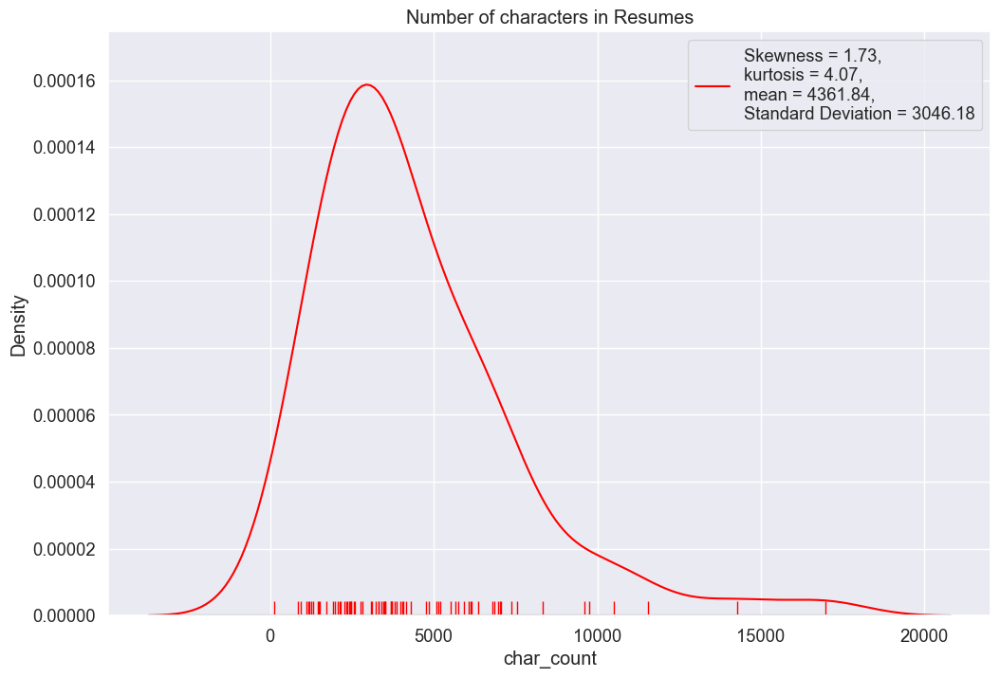

In [13]:
df1['char_count'] = df1['Resume'].str.len() 
# including spaces

skew = df1['char_count'].skew()
kurt = df1['char_count'].kurt()
mean = df1['char_count'].mean()
std = df1['char_count'].std()

plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["char_count"], color= 'red', hist=None, fit=stats.gamma,rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Number of characters in Resumes')
plt.legend(loc='best')
plt.show()

### 4.2.3] Average Word Length in Resume column

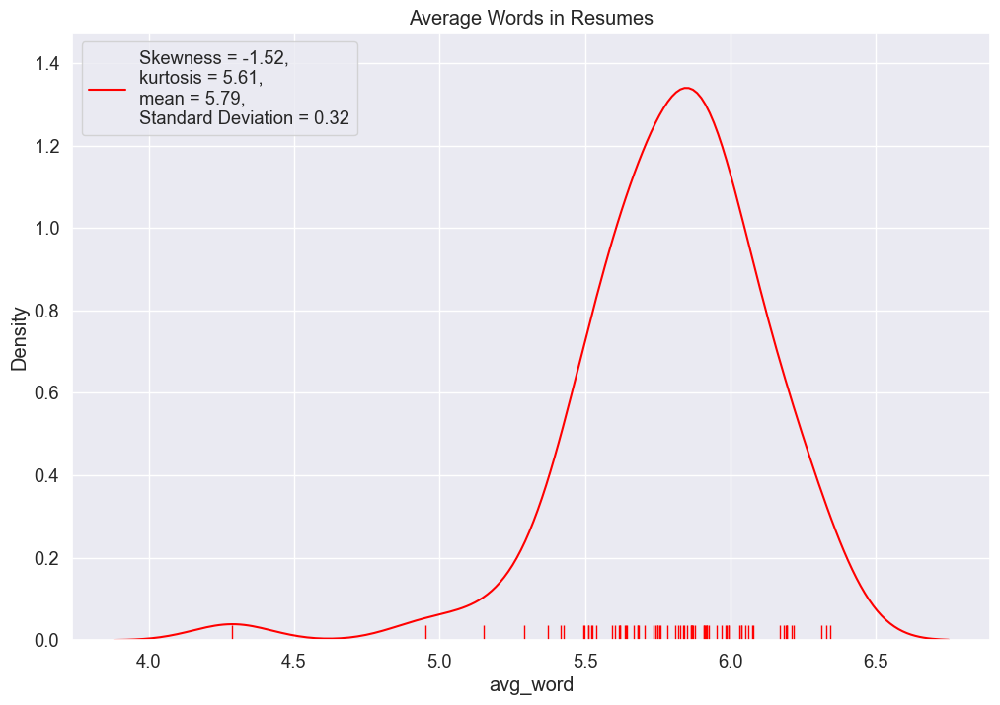

In [14]:
# function for average

def avg_word(sentence):
    words = sentence.split()
    return (sum(len(word) for word in words)/len(words))


df1['avg_word'] = df1['Resume'].apply(lambda x: avg_word(x))

skew = df1['avg_word'].skew()
kurt = df1['avg_word'].kurt()
mean = df1['avg_word'].mean()
std = df1['avg_word'].std()

plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["avg_word"], color = "red", hist = False,rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Average Words in Resumes')

plt.legend(loc='best')
plt.show()

### 4.2.4] Number of stopwords in Resume column

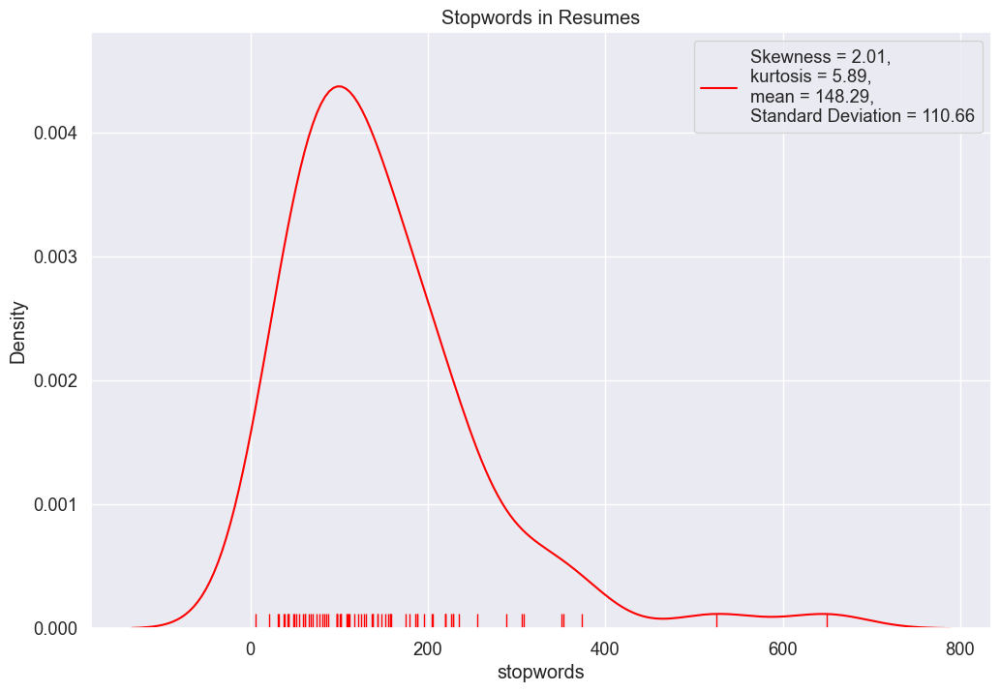

In [15]:
df1['stopwords'] = df1['Resume'].apply(lambda x: len([x for x in x.split() if x in stop]))

skew = df1['stopwords'].skew()
kurt = df1['stopwords'].kurt()
mean = df1['stopwords'].mean()
std = df1['stopwords'].std()
plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["stopwords"], color = "red", hist = False,rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Stopwords in Resumes')
plt.legend(loc='best')
plt.show()

### 4.2.5] Number of numerics in Resume column

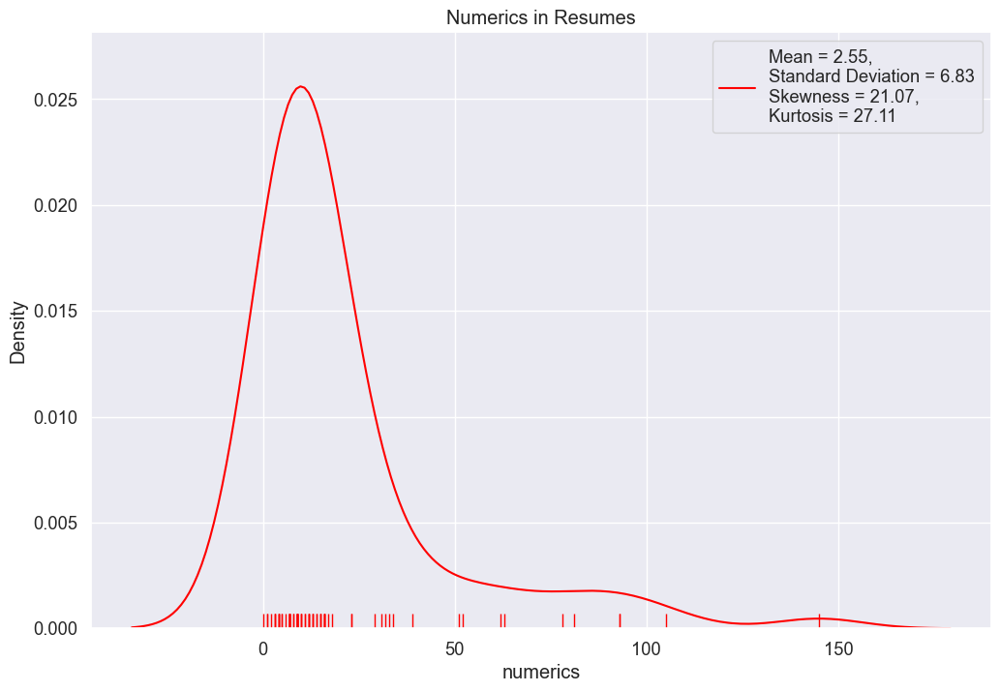

In [16]:
df1['numerics'] = df1['Resume'].apply(lambda x: len([x for x in x.split() if x.isdigit()]))

skew = df1['numerics'].skew()
kurt = df1['numerics'].kurt()
mean = df1['numerics'].mean()
std = df1['numerics'].std()
plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["numerics"], color = 'red',hist = False, rug=True,
             label= 'Mean = {:.2f},\nStandard Deviation = {:.2f}\nSkewness = {:.2f},\nKurtosis = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Numerics in Resumes')
plt.legend(loc='best')
plt.show()

### 4.2.6] Number of Uppercase words in Resume column

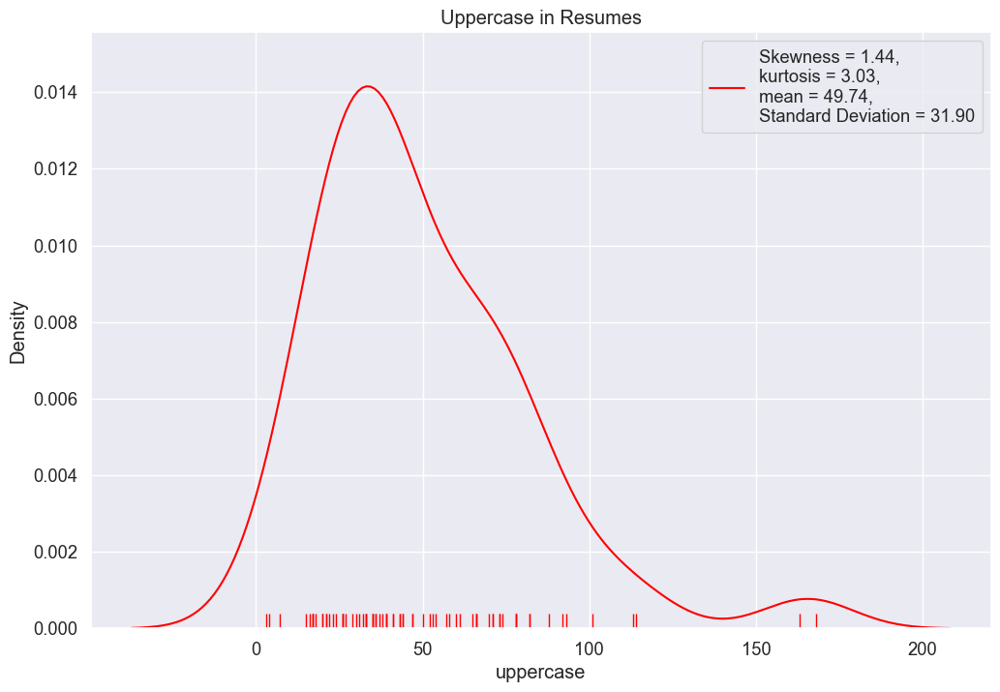

In [17]:
df1['uppercase'] = df1['Resume'].apply(lambda x: len([x for x in x.split() if x.isupper()]))

skew = df1['uppercase'].skew()
kurt = df1['uppercase'].kurt()
mean = df1['uppercase'].mean()
std = df1['uppercase'].std()
plt.figure(figsize=(12,8))
sns.set(font_scale=1.2)
sns.distplot(df1["uppercase"], color= "red", hist = False, rug=True,
             label='Skewness = {:.2f},\nkurtosis = {:.2f},\nmean = {:.2f},\nStandard Deviation = {:.2f}'
             .format(skew, kurt, mean, std), bins=30).set(title='Uppercase in Resumes')
plt.legend(loc='best')
plt.show()

In [18]:
df1['Category'] = df['Category']
df1.to_csv('Resume word counts.csv', index=False)
df1

,Resume,word_count,char_count,avg_word,stopwords,numerics,uppercase,Category
0,ANIL KUMAR MADDUKURI SQL MSBI Developer Summar...,627,4159,5.643770,125,9,47,SQL Developer
1,Aradhana Tripathi Current Location Gachibowli...,713,4851,5.821378,148,15,66,SQL Developer
2,BUDDHA VAMSI CAREER OBJECTIVE Have 2 11 years ...,223,1480,5.666667,39,12,36,SQL Developer
3,KAMBALLA PRADEEP SYNOPSIS Looking forward to a...,253,1731,5.869048,62,7,26,SQL Developer
4,Hyderabad Nazeer Basha SQL and Power BI Devel...,1118,7365,5.593554,288,16,78,SQL Developer
5,Resume Name Neeraj Mishra Having 3 year 6 Mon...,622,4047,5.525806,152,9,60,SQL Developer
6,SQL DEVELOPER Name Bandi prem sai Willing to w...,550,3705,5.748634,130,13,37,SQL Developer
7,SQL SERVER DEVELOPER Priyanka L Professional ...,468,3115,5.682403,102,12,114,SQL Developer
8,SQL SERVER DEVELOPER P Syam Kumar Professiona...,502,3319,5.636000,122,15,44,SQL Developer
9,RAJU PAVANA KUMARI Professional Summary Havin...,543,3717,5.868762,138,13,29,SQL Developer


In [19]:
df1.columns

Index(['Resume', 'word_count', 'char_count', 'avg_word', 'stopwords',
       'numerics', 'uppercase', 'Category'],
      dtype='object')

# 4.3] Lemmatization & Stemming
- Removed stopwords
- Removed Punctuations
- Lowered case
- Tokenized with regular expressions

In [20]:
def preprocess(text):
    text = str(text)
    text = text.lower()
    clean_text = re.compile('<.*?>')
    cleantext = re.sub(clean_text, '', text)
    url=re.sub(r'http\S+', '',cleantext)
    num = re.sub('[0-9]+', '', url)   
    
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(num)  
    filtered_words = [w for w in tokens 
                      if len(w) > 2 
                      if not w in stopwords.words('english')]
    
    stem_words=[stemmer.stem(w) for w in filtered_words]
    lemma_words=[lemmatizer.lemmatize(w) for w in stem_words]
    return " ".join(filtered_words)

In [21]:
df['Resume'][1]

' Aradhana Tripathi Current Location Gachibowli Hyderabad Profile Summary An accomplished data driven analytical professional have more than 4 years of working experience in information technology Service industry Currently working as SQL Database Developer and have 3 years of experience in database design development analysis and support of using MS SQL Server MySQL MariaDB and Athena AWS in development testing and production environments Extensive experience in writing complex queries creating Tables Views Union Triggers Stored Procedures User Defined Functions UDF s System Defined Functions and other T SQL statements Constraints and Indexes using various DDL and DML Commands Experience in using sub queries and joins to simplify complex queries involving multiple tables Experience in working on amazon relational database AWS RDS Have basic understanding on using analytical tools and technologies such as SAS R Bigdata Hadoop Hive HQL query etc Had experience in requirement gathering s

In [22]:
df3 = df['Resume'].apply(lambda x: preprocess(x))
df3[1]

'aradhana tripathi current location gachibowli hyderabad profile summary accomplished data driven analytical professional years working experience information technology service industry currently working sql database developer years experience database design development analysis support using sql server mysql mariadb athena aws development testing production environments extensive experience writing complex queries creating tables views union triggers stored procedures user defined functions udf system defined functions sql statements constraints indexes using various ddl dml commands experience using sub queries joins simplify complex queries involving multiple tables experience working amazon relational database aws rds basic understanding using analytical tools technologies sas bigdata hadoop hive hql query etc experience requirement gathering stakeholder management account management business insights visualization preparing dashboard using tableau excel technical skills language

In [23]:
df3= pd.DataFrame()
df3 = df[['Resume', 'Category']].rename(columns ={'Resume':'Raw_data'})
df3['Cleaned_data'] = df['Resume'].apply(lambda x: preprocess(x))
df3.head()

,Raw_data,Category,Cleaned_data
0,ANIL KUMAR MADDUKURI SQL MSBI Developer Summar...,SQL Developer,anil kumar maddukuri sql msbi developer summar...
1,Aradhana Tripathi Current Location Gachibowli...,SQL Developer,aradhana tripathi current location gachibowli ...
2,BUDDHA VAMSI CAREER OBJECTIVE Have 2 11 years ...,SQL Developer,buddha vamsi career objective years experience...
3,KAMBALLA PRADEEP SYNOPSIS Looking forward to a...,SQL Developer,kamballa pradeep synopsis looking forward aspi...
4,Hyderabad Nazeer Basha SQL and Power BI Devel...,SQL Developer,hyderabad nazeer basha sql power developer sum...


# 4.4] Text visualization using Wordcloud

- ### Most common words in different Job categories in the resumes can be observed by WordCloud

In [24]:
oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = df3['Cleaned_data'].values
cleanedSentences = ""

for records in Sentences:
    cleanedText = preprocess(records)
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    

wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('experience', 552), ('peoplesoft', 391), ('workday', 367), ('using', 355), ('application', 350), ('server', 326), ('reports', 309), ('data', 299), ('project', 257), ('business', 248), ('sql', 234), ('process', 219), ('database', 214), ('knowledge', 199), ('web', 193), ('worked', 185), ('integrations', 175), ('involved', 171), ('integration', 168), ('like', 163), ('good', 159), ('client', 159), ('creating', 156), ('system', 155), ('support', 149), ('servers', 148), ('hcm', 147), ('working', 146), ('development', 144), ('skills', 142), ('tools', 140), ('various', 139), ('report', 138), ('testing', 137), ('technical', 131), ('created', 128), ('production', 128), ('team', 127), ('issues', 126), ('people', 123), ('security', 121), ('design', 119), ('management', 118), ('domains', 115), ('eib', 115), ('responsibilities', 114), ('environment', 113), ('oracle', 113), ('services', 111), ('custom', 111)]


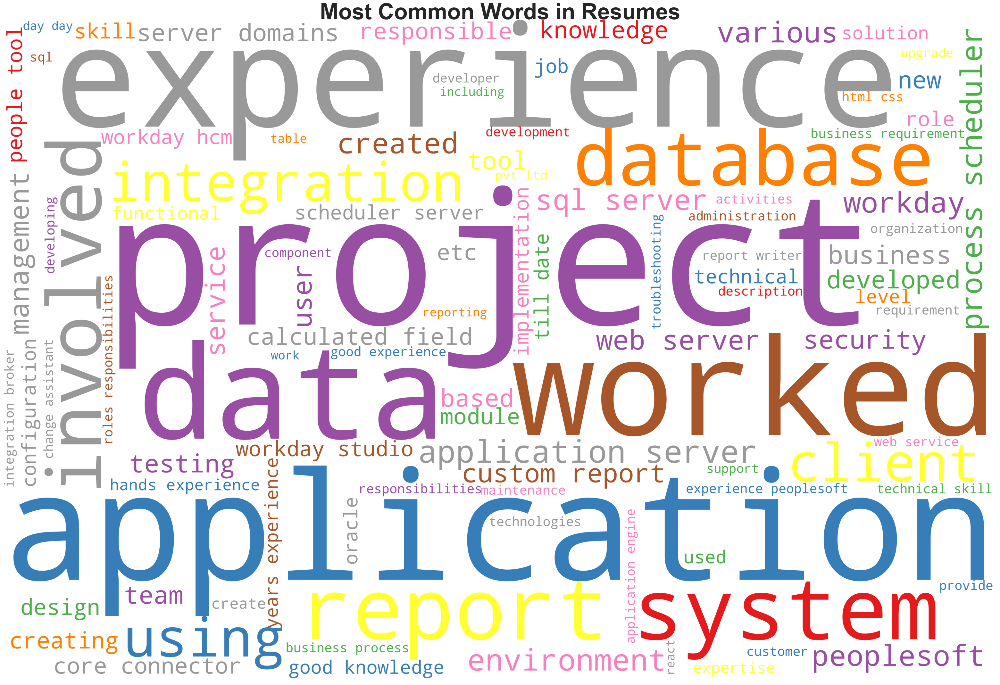

In [25]:
# Define a function to plot word cloud

def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.title('Most Common Words in Resumes', pad = 1, fontsize = 50, fontweight = 'bold')
    plt.axis('off')
    plt.show()
    

wordcloud=WordCloud(width=3000, scale=3, height=2000,background_color='white',collocations=True,
                    max_words=100, colormap='Set1').generate(cleanedSentences)

plot_cloud(wordcloud)

- ### Observe Wordcloud for each job category 

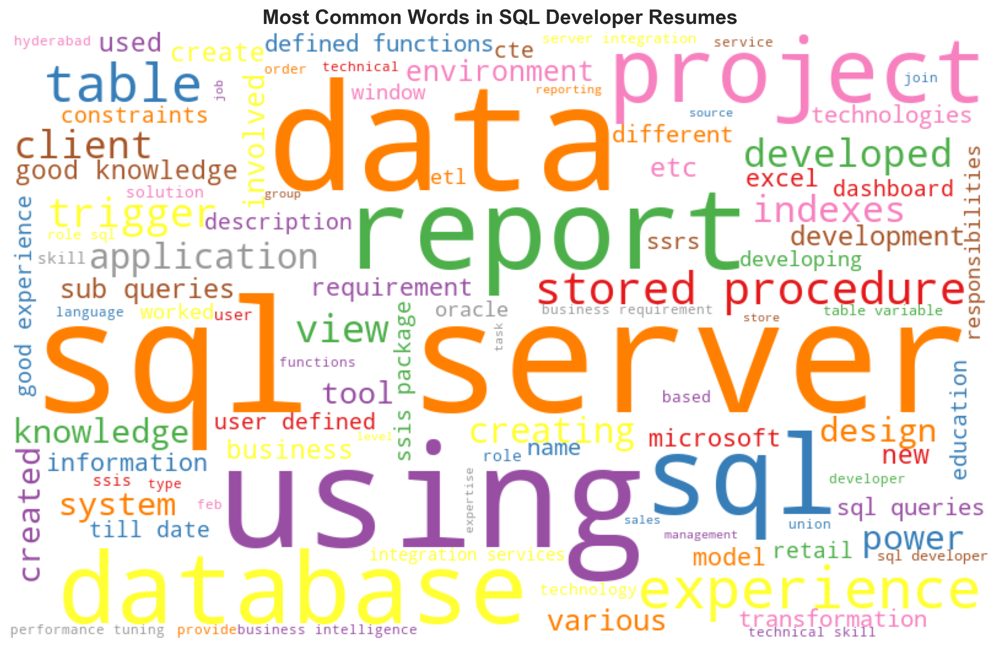

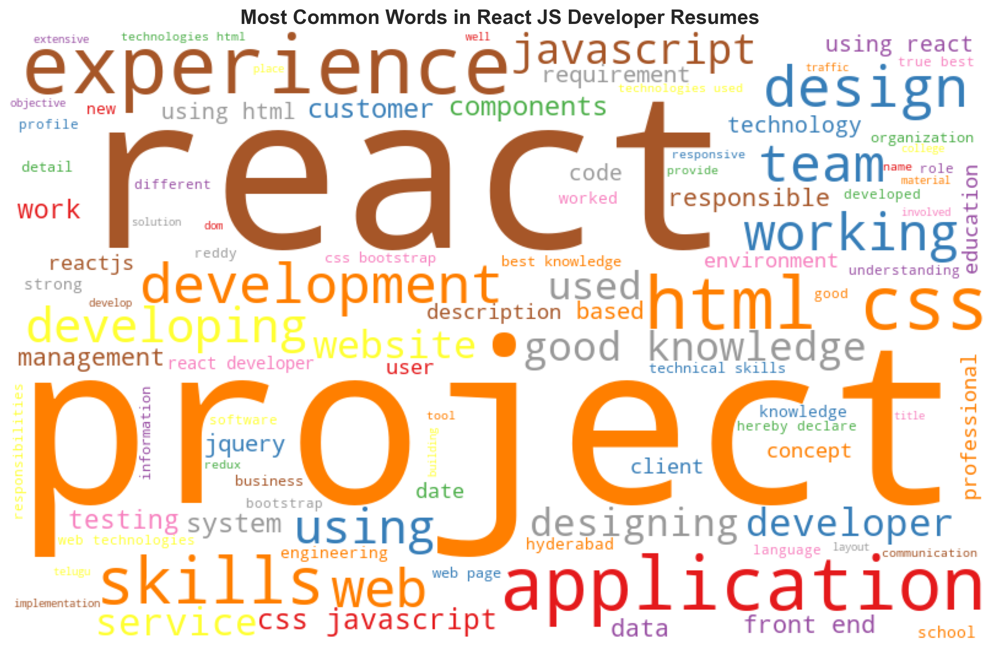

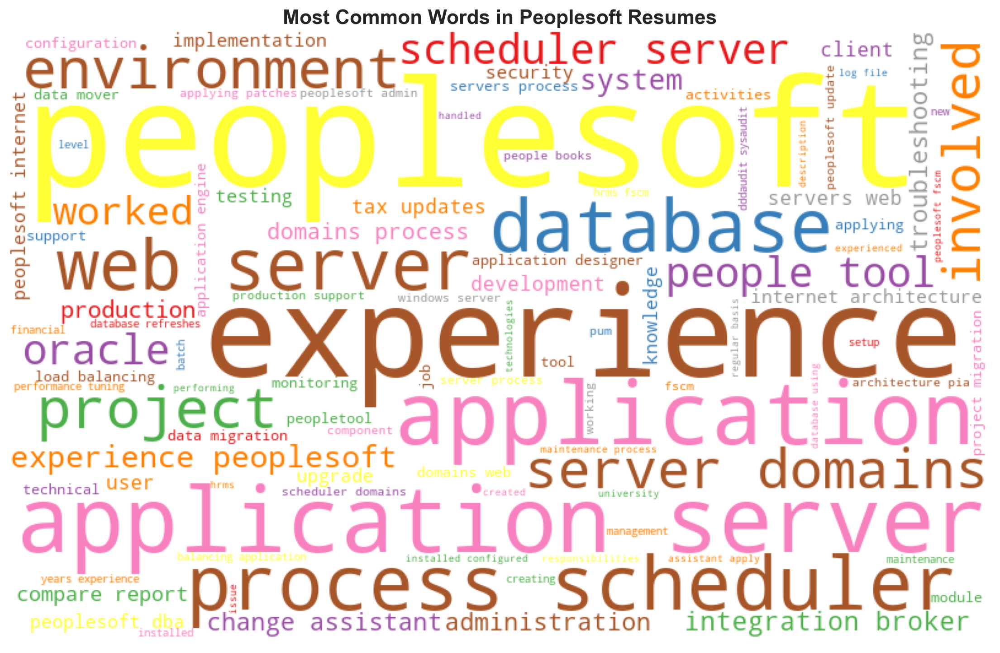

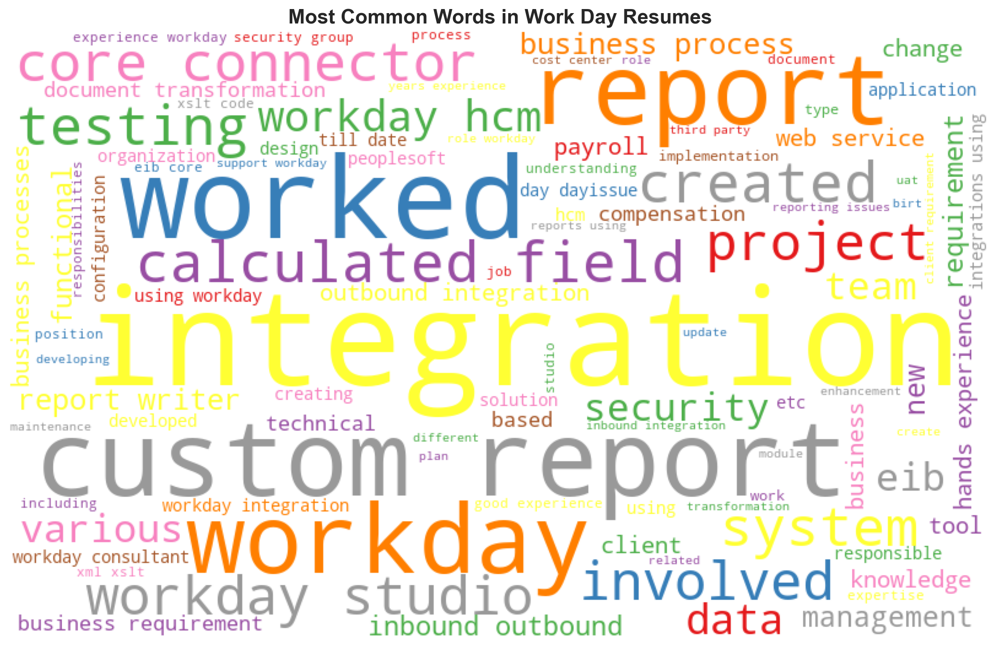

In [26]:
def generate_wordcloud(all_words, Profile):
    wordcloud = WordCloud(width=800, height=500,
                          background_color='white',max_words=100,colormap='Set1').generate(all_words)

    plt.figure(figsize=(14, 10), dpi=200)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title('Most Common Words in {} Resumes'.format(Profile), fontsize = 16, fontweight = 'bold')
    plt.show()
    
for profiles in df3['Category'].unique():
    all_words = ' '.join([text for text in df3['Cleaned_data'][df3['Category'] == profiles]])
    generate_wordcloud(all_words, profiles)

In [27]:
categories = np.sort(df3['Category'].unique())

df3_categories = [df3[df3['Category'] == category].loc[:, ['Cleaned_data', 'Category']] for category in categories]

In [28]:
def wordfreq(df3):
    count = df3['Cleaned_data'].str.split(expand=True).stack().value_counts().reset_index()
    count.columns = ['Word', 'Frequency']

    return count.head(10)

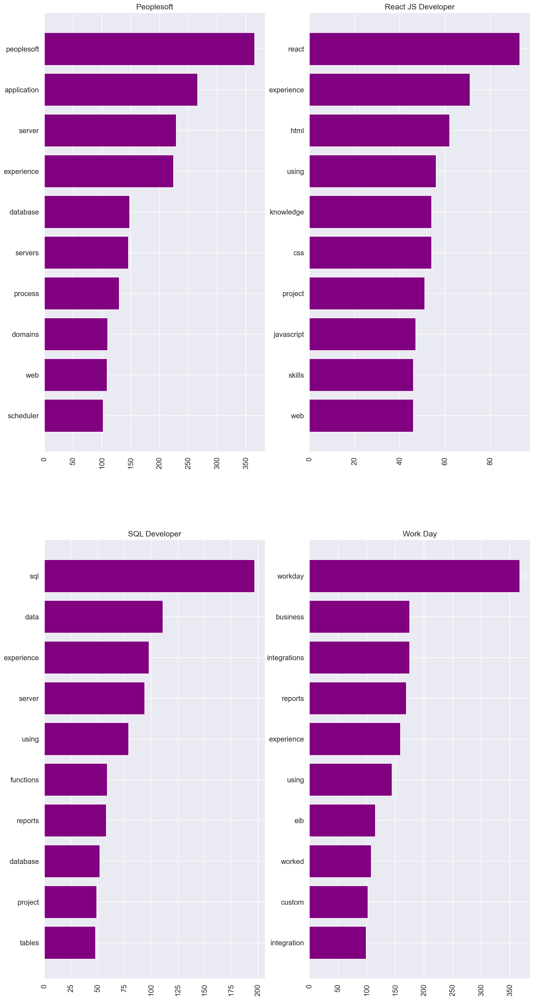

In [29]:
fig = plt.figure(figsize=(16, 32), dpi=200)

for i, category in enumerate(categories):
    wf = wordfreq(df3_categories[i]).sort_values(by = 'Frequency', ascending = True)

    fig.add_subplot(2, 2, i + 1).set_title(category)
    plt.barh(wf['Word'], wf['Frequency'], color='Purple')
    plt.xticks(rotation=90)

plt.show()

# 4.5] N-grams
- ### Extract Unigrams & Bigrams from our resumes using the ngrams function of the textblob library.

In [30]:
TextBlob(df3['Cleaned_data'][1]).ngrams(1)[:20]

[WordList(['aradhana']),
 WordList(['tripathi']),
 WordList(['current']),
 WordList(['location']),
 WordList(['gachibowli']),
 WordList(['hyderabad']),
 WordList(['profile']),
 WordList(['summary']),
 WordList(['accomplished']),
 WordList(['data']),
 WordList(['driven']),
 WordList(['analytical']),
 WordList(['professional']),
 WordList(['years']),
 WordList(['working']),
 WordList(['experience']),
 WordList(['information']),
 WordList(['technology']),
 WordList(['service']),
 WordList(['industry'])]

In [31]:
TextBlob(df3['Cleaned_data'][1]).ngrams(2)[:20]

[WordList(['aradhana', 'tripathi']),
 WordList(['tripathi', 'current']),
 WordList(['current', 'location']),
 WordList(['location', 'gachibowli']),
 WordList(['gachibowli', 'hyderabad']),
 WordList(['hyderabad', 'profile']),
 WordList(['profile', 'summary']),
 WordList(['summary', 'accomplished']),
 WordList(['accomplished', 'data']),
 WordList(['data', 'driven']),
 WordList(['driven', 'analytical']),
 WordList(['analytical', 'professional']),
 WordList(['professional', 'years']),
 WordList(['years', 'working']),
 WordList(['working', 'experience']),
 WordList(['experience', 'information']),
 WordList(['information', 'technology']),
 WordList(['technology', 'service']),
 WordList(['service', 'industry']),
 WordList(['industry', 'currently'])]

In [32]:
TextBlob(df3['Cleaned_data'][1]).ngrams(3)[:20]

[WordList(['aradhana', 'tripathi', 'current']),
 WordList(['tripathi', 'current', 'location']),
 WordList(['current', 'location', 'gachibowli']),
 WordList(['location', 'gachibowli', 'hyderabad']),
 WordList(['gachibowli', 'hyderabad', 'profile']),
 WordList(['hyderabad', 'profile', 'summary']),
 WordList(['profile', 'summary', 'accomplished']),
 WordList(['summary', 'accomplished', 'data']),
 WordList(['accomplished', 'data', 'driven']),
 WordList(['data', 'driven', 'analytical']),
 WordList(['driven', 'analytical', 'professional']),
 WordList(['analytical', 'professional', 'years']),
 WordList(['professional', 'years', 'working']),
 WordList(['years', 'working', 'experience']),
 WordList(['working', 'experience', 'information']),
 WordList(['experience', 'information', 'technology']),
 WordList(['information', 'technology', 'service']),
 WordList(['technology', 'service', 'industry']),
 WordList(['service', 'industry', 'currently']),
 WordList(['industry', 'currently', 'working'])]

## 4.5.1] Count Vectorizer on N-grams

In [33]:
c_vec = CountVectorizer(stop_words=stopwords.words('english'), ngram_range=(1,2))
# matrix of ngrams- unigrams &bigrams(1,2)

ngrams = c_vec.fit_transform(df3['Cleaned_data'])
# count frequency of ngrams

count_values = ngrams.toarray().sum(axis=0)
# list of ngrams

vocab = c_vec.vocabulary_
df_ngram = pd.DataFrame(sorted([(count_values[i],k) 
                                for k,i in vocab.items()], 
                                 reverse=True)).rename(columns={0: 'Frequency', 1:'Unigram/Bigram'})

In [34]:
fig = px.bar(df_ngram.head(10), y = 'Unigram/Bigram', x = 'Frequency',
                                        text = 'Frequency', color = 'Frequency',
                                               title = 'Top 20 Most used Words in Resumes')

fig.update_xaxes(tickangle=-90)
fig.update_layout( title_x = 0.5)

# 4.6] Named Entity Recognition (NER)

In [35]:
oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = df3['Cleaned_data'].values
cleanedSentences = ""

for records in Sentences:
    cleanedText = preprocess(records)
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)

In [36]:
## Part Of Speech Tagging
nlp = spacy.load('en_core_web_sm')

one_block=cleanedSentences[:3000]
#slicing of row

doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [37]:
for token in doc_block[:50]:
    print(token,token.pos_)  

anil PROPN
kumar PROPN
maddukuri PROPN
sql PROPN
msbi PROPN
developer NOUN
summary NOUN
years NOUN
experience VERB
sql NOUN
server NOUN
ssms NOUN
creating VERB
ssis NOUN
packages NOUN
ssrs VERB
reports NOUN
using VERB
microsoft PROPN
business NOUN
intelligence NOUN
msbi NOUN
tools NOUN
expertise VERB
various ADJ
types NOUN
joins VERB
sub NOUN
queries NOUN
writing VERB
complex ADJ
queries NOUN
involving VERB
multiple ADJ
tables NOUN
handled VERB
data NOUN
manipulation NOUN
data NOUN
consistency NOUN
creating VERB
views NOUN
triggers NOUN
synonyms VERB
hands NOUN
experience VERB
creation NOUN
optimization NOUN
debugging VERB
stored VERB


# 4.7] Dealing with nouns and verbs 

In [38]:
# Filtering the nouns and verbs only

one_block=cleanedSentences
doc_block=nlp(one_block)
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['task', 'execute', 'sql', 'task', 'control', 'flow', 'execute', 'package', 'task', 'execute', 'process', 'sends', 'mail', 'script', 'control', 'flow', 'level', 'experience', 'using', 'data', 'oledb', 'command', 'row', 'count', 'derived', 'column', 'merge', 'merge', 'join', 'lookup', 'split', 'transformation', 'manipulate', 'data', 'ssis', 'package', 'data', 'flow', 'level', 'moving', 'data', 'source', 'destination', 'implemented', 'ssis', 'loggings', 'check', 'points', 'points', 'package', 'configurations', 'source', 'system', 'source', 'system', 'etl', 'operations', 'experience', 'developing', 'table', 'reports', 'sub', 'reports', 'matrix', 'reports', 'drill', 'reports', 'drill', 'reports', 'using', 'server', 'reporting', 'services', 'involved', 'linked', 'reports', 'cache', 'reports', 'reports', 'report', 'manager', 'level', 'expertise', 'performing', 'restore', 'database', 'created', 'indexes', 'clustered', 'index', 'clustered', 'index', 'improve', 'performance', 'skills', 'languag

## 4.7.1] Counting all the nouns and verbs present in tokens above

In [39]:
# Counting the noun & verb tokens
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq, key=lambda x: x[1], reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] 
# top 10 noun & verb 

,word,count
0,experience,545
1,using,355
2,application,350
3,server,322
4,reports,309
5,data,274
6,business,244
7,project,235
8,process,213
9,database,197


- ### Visualizing the Result of Top 10 nouns and verbs most frequently present in the Resumes

In [40]:
# Top 10 nouns & verbs
fig = px.bar(wd_df.head(10), x = 'word', y = 'count',
                           hover_name = 'word', text = 'count', 
                               color = 'count', title = 'Top 10 nouns & verbs')

fig.update_xaxes(tickangle=-90)
fig.update_layout( title_x = 0.5)

# 4.8] Bag of Words (BOW)
- ### without N grams

In [41]:
cv=CountVectorizer()
resumecv =cv.fit_transform(requiredWords)

In [42]:
print(cv.vocabulary_)

{'vinay': 257, 'kumar': 122, 'workday': 262, 'functional': 94, 'consultant': 41, 'expertise': 88, 'summary': 221, 'years': 270, 'total': 239, 'experience': 86, 'knowledge': 121, 'modules': 145, 'core': 44, 'hcm': 101, 'supervisory': 222, 'organization': 158, 'delegation': 59, 'cost': 45, 'center': 20, 'locations': 130, 'security': 207, 'implementing': 106, 'integrations': 112, 'various': 255, 'including': 108, 'compensation': 30, 'time': 237, 'tracking': 242, 'absence': 1, 'management': 135, 'payroll': 165, 'benefits': 12, 'performance': 170, 'good': 97, 'groups': 99, 'role': 198, 'based': 11, 'user': 251, 'job': 119, 'experienced': 87, 'report': 189, 'writing': 267, 'custom': 49, 'reports': 191, 'simple': 212, 'advanced': 5, 'matrix': 138, 'composite': 33, 'calculated': 18, 'fields': 91, 'eib': 72, 'connectors': 40, 'xml': 268, 'xslt': 269, 'web': 258, 'services': 210, 'structure': 218, 'objects': 154, 'hands': 100, 'migrating': 142, 'code': 26, 'lower': 131, 'tenant': 233, 'sandbox':

In [43]:
print(cv.get_feature_names_out()[109:200])

['independent' 'information' 'integration' 'integrations' 'interface'
 'interfaces' 'internal' 'interpersonal' 'involved' 'issues' 'job' 'keys'
 'knowledge' 'kumar' 'languages' 'layout' 'leadership' 'legacy' 'like'
 'loading' 'location' 'locations' 'lower' 'mahindra' 'maintain' 'managed'
 'management' 'mass' 'master' 'matrix' 'members' 'menus' 'microsoft'
 'migrating' 'modifications' 'modified' 'modules' 'monitor' 'monitored'
 'moving' 'multiple' 'narayana' 'needed' 'new' 'object' 'objects' 'one'
 'online' 'order' 'organization' 'organizations' 'outbound' 'output'
 'ownership' 'pages' 'payments' 'payroll' 'people' 'peoplesoft' 'per'
 'perform' 'performance' 'performing' 'personal' 'player' 'powerpoint'
 'process' 'processes' 'processing' 'production' 'professional' 'project'
 'prompt' 'publisher' 'queries' 'query' 'ran' 'ready' 'records'
 'relationships' 'report' 'reporting' 'reports' 'requests' 'requirement'
 'requirements' 'resolve' 'resolved' 'responsibilities' 'role' 'roles']


In [44]:
print(cv.get_feature_names_out()[:100])

['ability' 'absence' 'account' 'activity' 'administration' 'advanced'
 'allowances' 'analyst' 'application' 'assign' 'bank' 'based' 'benefits'
 'best' 'building' 'built' 'bulk' 'business' 'calculated' 'calls' 'center'
 'challenge' 'change' 'changes' 'clarifications' 'client' 'code' 'college'
 'communication' 'company' 'compensation' 'component' 'components'
 'composite' 'concepts' 'configurable' 'configure' 'configured'
 'configuring' 'connector' 'connectors' 'consultant' 'contacts'
 'conversions' 'core' 'cost' 'created' 'csv' 'current' 'custom'
 'customers' 'customized' 'daily' 'data' 'date' 'day' 'declaration'
 'declare' 'definition' 'delegation' 'delivered' 'design' 'designation'
 'designed' 'develop' 'developed' 'development' 'different' 'document'
 'documents' 'edits' 'education' 'eib' 'eibs' 'emergency' 'employees'
 'enable' 'engine' 'engineering' 'engines' 'enhancements' 'errors' 'etc'
 'excel' 'excellent' 'existing' 'experience' 'experienced' 'expertise'
 'external' 'field' 'fi

In [45]:
print(resumecv.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


## 4.8.1] CountVectorizer with N-grams (Bigrams & Trigrams)

In [46]:
ps = PorterStemmer()
corpus_cv = []
for i in tqdm_notebook(range(0, len(df3))):
    text = re.sub('[^a-zA-Z]', ' ', df3['Cleaned_data'][i])
    text = text.lower()
    text = text.split()
    
    text = [ps.stem(word) for word in text if not word in stopwords.words('english')]
    text = ' '.join(text)
    corpus_cv.append(text)

  0%|          | 0/76 [00:00<?, ?it/s]

In [47]:
df3['Cleaned_data'][1]

'aradhana tripathi current location gachibowli hyderabad profile summary accomplished data driven analytical professional years working experience information technology service industry currently working sql database developer years experience database design development analysis support using sql server mysql mariadb athena aws development testing production environments extensive experience writing complex queries creating tables views union triggers stored procedures user defined functions udf system defined functions sql statements constraints indexes using various ddl dml commands experience using sub queries joins simplify complex queries involving multiple tables experience working amazon relational database aws rds basic understanding using analytical tools technologies sas bigdata hadoop hive hql query etc experience requirement gathering stakeholder management account management business insights visualization preparing dashboard using tableau excel technical skills language

In [48]:
corpus_cv[1]

'aradhana tripathi current locat gachibowli hyderabad profil summari accomplish data driven analyt profession year work experi inform technolog servic industri current work sql databas develop year experi databas design develop analysi support use sql server mysql mariadb athena aw develop test product environ extens experi write complex queri creat tabl view union trigger store procedur user defin function udf system defin function sql statement constraint index use variou ddl dml command experi use sub queri join simplifi complex queri involv multipl tabl experi work amazon relat databas aw rd basic understand use analyt tool technolog sa bigdata hadoop hive hql queri etc experi requir gather stakehold manag account manag busi insight visual prepar dashboard use tableau excel technic skill languag sql sa python dbm sql server sql aw rd athena mariadb version mysql ide sql server manag studio ssm razorsql heidisql rstudio visual tool tableau excel domain media public bfsi retail emplo

In [49]:
## Applying Countvectorizer
# Creating the Bag of Words model

cv = CountVectorizer(max_features=5000,ngram_range=(1,3))
X = cv.fit_transform(corpus_cv).toarray()

In [50]:
cv.get_feature_names_out()[:20]

array(['abil', 'abil work', 'abil work team', 'absenc', 'absenc manag',
       'academ', 'accentur', 'accept', 'accept level',
       'accept level statu', 'accept test', 'access', 'access peopl',
       'access peopl book', 'accord', 'accord chang',
       'accord chang request', 'account', 'account inform',
       'account inform cost'], dtype=object)

In [51]:
cv.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.int64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 5000,
 'min_df': 1,
 'ngram_range': (1, 3),
 'preprocessor': None,
 'stop_words': None,
 'strip_accents': None,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'vocabulary': None}

In [52]:
count_df = pd.DataFrame(X, columns=cv.get_feature_names_out())
count_df

,abil,abil work,abil work team,absenc,absenc manag,academ,accentur,accept,accept level,accept level statu,...,year,year experi,year experi develop,year experi peoplesoft,year experi workday,year extens,year month,year profession,year profession experi,year workday
0,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
1,0,0,0,0,0,2,0,0,0,0,...,2,1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,2,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,1,0
9,0,0,0,0,0,1,0,0,0,0,...,1,0,0,0,0,0,0,1,1,0


# 4.9] TF-IDF Vectorizer

In [53]:
ps = PorterStemmer()
corpus_tf = []
for i in tqdm_notebook(range(0, len(df3))):
    text = re.sub('[^a-zA-Z]', ' ', df3['Cleaned_data'][i])
    text = text.lower()
    text = text.split()
    
    text = [ps.stem(word) for word in text if not word in stopwords.words('english')]
    text = ' '.join(text)
    corpus_tf.append(text)

  0%|          | 0/76 [00:00<?, ?it/s]

In [54]:
corpus_tf[1]

'aradhana tripathi current locat gachibowli hyderabad profil summari accomplish data driven analyt profession year work experi inform technolog servic industri current work sql databas develop year experi databas design develop analysi support use sql server mysql mariadb athena aw develop test product environ extens experi write complex queri creat tabl view union trigger store procedur user defin function udf system defin function sql statement constraint index use variou ddl dml command experi use sub queri join simplifi complex queri involv multipl tabl experi work amazon relat databas aw rd basic understand use analyt tool technolog sa bigdata hadoop hive hql queri etc experi requir gather stakehold manag account manag busi insight visual prepar dashboard use tableau excel technic skill languag sql sa python dbm sql server sql aw rd athena mariadb version mysql ide sql server manag studio ssm razorsql heidisql rstudio visual tool tableau excel domain media public bfsi retail emplo

In [55]:
## TFidf Vectorizer
tfidf_v = TfidfVectorizer(max_features=5000,ngram_range=(1,3))
X = tfidf_v.fit_transform(corpus_tf).toarray()

In [56]:
tfidf_v.get_feature_names_out()[:20]

array(['abil', 'abil work', 'abil work team', 'absenc', 'absenc manag',
       'academ', 'accentur', 'accept', 'accept level',
       'accept level statu', 'accept test', 'access', 'access peopl',
       'access peopl book', 'accord', 'accord chang',
       'accord chang request', 'account', 'account inform',
       'account inform cost'], dtype=object)

In [57]:
tfidf_v.get_feature_names_out()[4980:]

array(['xpath', 'xslt', 'xslt code', 'xslt code per', 'xslt code report',
       'xslt differ', 'xslt present', 'xslt present data', 'xtt',
       'xtt function', 'year', 'year experi', 'year experi develop',
       'year experi peoplesoft', 'year experi workday', 'year extens',
       'year month', 'year profession', 'year profession experi',
       'year workday'], dtype=object)

In [58]:
tfidf_v.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.float64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 5000,
 'min_df': 1,
 'ngram_range': (1, 3),
 'norm': 'l2',
 'preprocessor': None,
 'smooth_idf': True,
 'stop_words': None,
 'strip_accents': None,
 'sublinear_tf': False,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'use_idf': True,
 'vocabulary': None}

In [59]:
tfidf_df = pd.DataFrame(X, columns=tfidf_v.get_feature_names_out())
tfidf_df

,abil,abil work,abil work team,absenc,absenc manag,academ,accentur,accept,accept level,accept level statu,...,year,year experi,year experi develop,year experi peoplesoft,year experi workday,year extens,year month,year profession,year profession experi,year workday
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.008774,0.011965,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.049186,0.000000,0.000000,0.000000,0.000000,...,0.017715,0.012079,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.063122,0.000000,0.000000,0.000000,0.000000,...,0.022734,0.031001,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.034534,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.019806,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.061443,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.004981,0.006792,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.016637,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.009542,0.000000,0.000000,0.000000,0.000000,0.000000,0.032532,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.006916,0.009431,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.025814,0.017601,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.014036,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.043542,0.045517,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000,0.036880,0.000000,0.000000,0.000000,0.000000,...,0.013283,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.041206,0.043075,0.000000


In [60]:
ps = PorterStemmer()
corpus = []
for i in tqdm_notebook(range(0, len(df3))):
    text = re.sub('[^a-zA-Z]', ' ', df3['Cleaned_data'][i])
    text = text.lower()
    text = text.split()
    
    text = [ps.stem(word) for word in text if not word in stopwords.words('english')]
    text = ' '.join(text)
    corpus.append(text)


word_vectorizer = TfidfVectorizer(sublinear_tf=True,stop_words='english',
                                  max_features=5000,ngram_range=(1,3))

tfidf = word_vectorizer.fit(corpus)
WordFeatures = word_vectorizer.transform(corpus).toarray()


tfidf_df = pd.DataFrame(WordFeatures, columns=tfidf.get_feature_names_out())
tfidf_df

  0%|          | 0/76 [00:00<?, ?it/s]

,abil,abil work,abil work team,absenc,absenc manag,academ,accentur,accept,accept level,accept level statu,...,year,year experi,year experi develop,year experi peoplesoft,year experi workday,year extens,year month,year profession,year profession experi,year workday
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.013151,0.017934,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.069574,0.000000,0.000000,0.000000,0.000000,...,0.025058,0.020182,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.075306,0.000000,0.000000,0.000000,0.000000,...,0.027122,0.036985,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.041406,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.023747,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.073669,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.010057,0.013715,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.027655,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.015860,0.000000,0.000000,0.000000,0.000000,0.000000,0.054075,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.011488,0.015666,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.029162,0.023487,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.017226,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.053440,0.055864,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000,0.047085,0.000000,0.000000,0.000000,0.000000,...,0.016958,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.052607,0.054994,0.000000


In [61]:
df3.to_csv('Resume cleaned.csv', index = False)

In [62]:
tfidf_df.to_csv('Resume TF-IDF.csv', index = False)

In [63]:
pickle.dump(tfidf, open("tfidf.pkl", "wb"))